<a href="https://colab.research.google.com/github/sunnyisabaster/Python27PygamePy2exe/blob/master/master_project_cascadeTest.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# install dependencies: 
!pip install pyyaml==5.1 pycocotools>=2.0.1
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

1.6.0+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [ ]:
# install detectron2: (colab has CUDA 10.1 + torch 1.6)
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
assert torch.__version__.startswith("1.6")
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html
     |████████████████████████████████| 6.6MB 694kB/s 
     |████████████████████████████████| 2.2MB 4.0MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.1.post20200716-cp36-none-any.whl size=42325 sha256=46c24c5ca525195dfcd44417f9886da0f76e749b424668dba66120137d78bb56
  Stored in directory: /root/.cache/pip/wheels/81/99/f4/42a6bef61c07b3d78dfe6d7ebff259444c4526504cf72378d7
Successfully built fvcore
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: Pillow 7.0.0
    Uninstalling Pillow-7.0.0:
      Successfully uninstalled Pillow-7.0.0


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [ ]:
!nvidia-smi

Wed Aug  5 15:29:42 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.57       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   45C    P0    26W / 250W |     10MiB / 16280MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:
import re
import os
import pickle
with open('/content/drive/My Drive/Master project/video_data/annotations/maskrcnn/niap_fix_maskrcnn_train0_30.pik', 'rb') as f:# ------------change here
        train_data = pickle.load(f)

file_path = list(list(train_data[1].items())[1])[1]
filename = file_path.replace('/data/NIAP/Data/frames','/data/project/frame')
really_filename = file_path.replace('/data/NIAP/Data/frames/', '')
images_path = re.sub(r"/+\d+.jpg",'',really_filename) 
copy_dist = '/content/drive/My Drive/Master project/annotation_images/train/' + images_path
print(file_path)
print(filename)
print(really_filename)
print(images_path)
print(copy_dist)

/data/NIAP/Data/frames/aja-helo-1H000314_2017-12-01_0000/508.jpg
/data/project/frame/aja-helo-1H000314_2017-12-01_0000/508.jpg
aja-helo-1H000314_2017-12-01_0000/508.jpg
aja-helo-1H000314_2017-12-01_0000
/content/drive/My Drive/Master project/annotation_images/train/aja-helo-1H000314_2017-12-01_0000


In [ ]:
# transform as coco data
import os
import pickle
import numpy as np
import json
import re
import cv2
import glob
import shutil
import sys, stat
# import pycocotools.mask as maskUtils
from detectron2.structures import BoxMode


def get_fish_dicts(file_obj):
    if file_obj == 'train':
        file_dir = '/content/drive/My Drive/Master project/video_data/annotations/maskrcnn/niap_fix_maskrcnn_train0_30.pik'
    elif file_obj == 'val':
        file_dir = '/content/drive/My Drive/Master project/video_data/annotations/maskrcnn/niap_fix_maskrcnn_val_30_40.pik'
    elif file_obj == 'test':  
        file_dir = '/content/drive/My Drive/Master project/video_data/annotations/maskrcnn/niap_fix_maskrcnn_test_40_45.pik'
    else:
        print('Cant find your file !!!')
    with open(file_dir, 'rb') as f:# ------------change here
        train_data = pickle.load(f)
    total_obj = max(train_data.keys())+1 # objs amount
    #total_obj = 2
    i = -1
    
    #open_train = '/content/drive/My Drive/Master project/annotation_images/train/json_annotation_train.json'
    #open_val = '/content/drive/My Drive/Master project/annotation_images/val/json_annotation_val.json'
    #open_test = '/content/drive/My Drive/Master project/annotation_images/test/json_annotation_test.json'

    # open_dir = os.path.join(img_dir, 'instances_train2017')
    # f=open(open_train,'w')# ------------change here

    
    dataset_dicts = []
    for v in range(total_obj):
        #print("write:")
        print(v)

        record = {}

        # image details
        file_path = list(list(train_data[v].items())[1])[1]
        # print(file_path)
        filename = file_path.replace('/data/NIAP/Data/frames','/content/drive/My Drive/Master project/Final/Images')
        
        height, width = cv2.imread(filename).shape[:2]
        really_filename = file_path.replace('/data/NIAP/Data/frames/', '')

        record["file_name"] = filename
        record["image_id"] = v
        record["height"] = height
        record["width"] = width

        # find all image pathes and copy them to dataset folders
        images_path = re.sub(r"/+\d+.jpg",'',really_filename) 
        
        # absolute_path = os.path.join('/content/drive/My Drive/Master project/Final/Images',images_path)

        copy_dist = '/content/drive/My Drive/Master project/annotation_images/train/' + images_path

        # print(copy_dist)
        #if not os.path.exists(copy_dist):
        #    os.mkdir(copy_dist)
        #    os.chmod(copy_dist , stat.S_IRWXU|stat.S_IRGRP|stat.S_IROTH)
        #    shutil.copy( filename, copy_dist)
        #else:
        #    os.chmod(copy_dist , stat.S_IRWXU|stat.S_IRGRP|stat.S_IROTH)
        #    shutil.copy( filename, copy_dist)
        annos = train_data[v]['points']

        objs = []
        # print(annos)
        for point in annos:
        #annotation points
            # points = list(list(train_data[v].items())[0])[1]
            str_a = ','.join(str(x) for x in point)
            str_a1 = str_a.replace('[','')
            str_a2 = str_a1.replace(']','')
            clean_str = ' '.join(str_a2.split())
            str_a3 = re.sub('[\s+]',',',clean_str)
            points_list = str_a3.split(',')
            points_list = filter(None, points_list)#remove ''
            a_float_m = map(float, points_list)
            # print('::',points_list,'::')
            a_float_m = list(a_float_m)

            px = a_float_m[::2]
            py = a_float_m[1::2]

        
            poly = [(x + 0.5, y + 0.5) for x, y in zip(px, py)]
            poly = [p for x in poly for p in x]
            # print(":",len(poly),":")
            
            if len(poly) <= 4:
                continue
            else:
                # calculate area
            #rles = maskUtils.frPyObjects([poly], height, width)
            #rle = maskUtils.merge(rles)
            #    area = float(maskUtils.area(rle))
                
                i = i+1
                    
                anno = {
                    "bbox": [np.min(px), np.min(py), np.max(px), np.max(py)],
                    "bbox_mode": BoxMode.XYXY_ABS,
                    "segmentation": [poly],
                    "category_id": 0,
                } 
            objs.append(anno)
        record["annotations"] = objs

        dataset_dicts.append(record)
    #print(dataset_dicts)
    
    str_a = str(dataset_dicts)
    #print(len(str_a))
    #f.write(str_a)
    # break
    #f.close()
    print('Finished')
    return dataset_dicts

# json_file = get_fish_dicts()

# print(dataset_dicts)



In [ ]:
for d in ["train", "val" , "test"]:
    DatasetCatalog.register("fish_" + d, lambda d=d: get_fish_dicts(d))
    MetadataCatalog.get("fish_" + d).set(thing_classes=["fish"])
fish_metadata = MetadataCatalog.get("fish_train")

流式输出内容被截断，只能显示最后 5000 行内容。
3987
3988
3989
3990
3991
3992
3993
3994
3995
3996
3997
3998
3999
4000
4001
4002
4003
4004
4005
4006
4007
4008
4009
4010
4011
4012
4013
4014
4015
4016
4017
4018
4019
4020
4021
4022
4023
4024
4025
4026
4027
4028
4029
4030
4031
4032
4033
4034
4035
4036
4037
4038
4039
4040
4041
4042
4043
4044
4045
4046
4047
4048
4049
4050
4051
4052
4053
4054
4055
4056
4057
4058
4059
4060
4061
4062
4063
4064
4065
4066
4067
4068
4069
4070
4071
4072
4073
4074
4075
4076
4077
4078
4079
4080
4081
4082
4083
4084
4085
4086
4087
4088
4089
4090
4091
4092
4093
4094
4095
4096
4097
4098
4099
4100
4101
4102
4103
4104
4105
4106
4107
4108
4109
4110
4111
4112
4113
4114
4115
4116
4117
4118
4119
4120
4121
4122
4123
4124
4125
4126
4127
4128
4129
4130
4131
4132
4133
4134
4135
4136
4137
4138
4139
4140
4141
4142
4143
4144
4145
4146
4147
4148
4149
4150
4151
4152
4153
4154
4155
4156
4157
4158
4159
4160
4161
4162
4163
4164
4165
4166
4167
4168
4169
4170
4171
4172
4173
4174
4175
4176
4177
4178
4179
4180
418

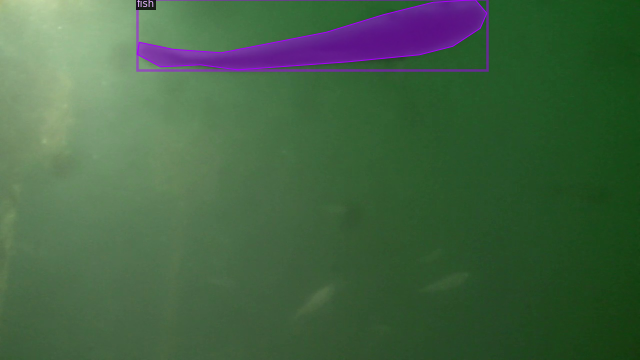

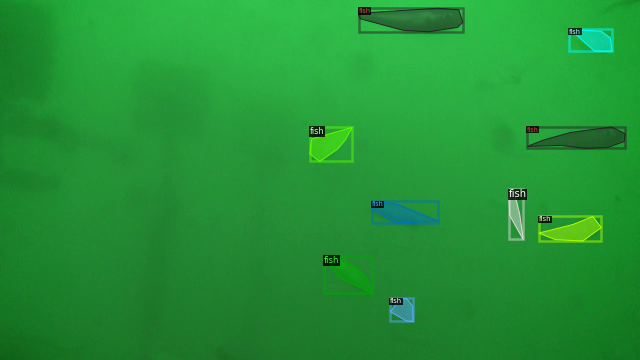

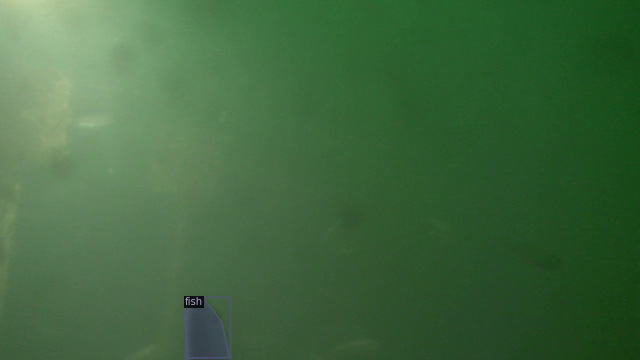

In [ ]:
dataset_dicts = get_fish_dicts('train')

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=fish_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
#open_train = '/content/drive/My Drive/Master project/annotation_images/train/json_annotation_train.json'
#f=open(open_train,'w')
#str_a = str(dataset_dicts)
#f.write(str_a)
#f.close()

In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("Misc/cascade_mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("fish_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("Misc/cascade_mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 90000    # was 180000 iterations seems good enough for this toy dataset; you may need to train longer for a practical dataset
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (fish)

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

流式输出内容被截断，只能显示最后 5000 行内容。
3997
3998
3999
4000
4001
4002
4003
4004
4005
4006
4007
4008
4009
4010
4011
4012
4013
4014
4015
4016
4017
4018
4019
4020
4021
4022
4023
4024
4025
4026
4027
4028
4029
4030
4031
4032
4033
4034
4035
4036
4037
4038
4039
4040
4041
4042
4043
4044
4045
4046
4047
4048
4049
4050
4051
4052
4053
4054
4055
4056
4057
4058
4059
4060
4061
4062
4063
4064
4065
4066
4067
4068
4069
4070
4071
4072
4073
4074
4075
4076
4077
4078
4079
4080
4081
4082
4083
4084
4085
4086
4087
4088
4089
4090
4091
4092
4093
4094
4095
4096
4097
4098
4099
4100
4101
4102
4103
4104
4105
4106
4107
4108
4109
4110
4111
4112
4113
4114
4115
4116
4117
4118
4119
4120
4121
4122
4123
4124
4125
4126
4127
4128
4129
4130
4131
4132
4133
4134
4135
4136
4137
4138
4139
4140
4141
4142
4143
4144
4145
4146
4147
4148
4149
4150
4151
4152
4153
4154
4155
4156
4157
4158
4159
4160
4161
4162
4163
4164
4165
4166
4167
4168
4169
4170
4171
4172
4173
4174
4175
4176
4177
4178
4179
4180
4181
4182
4183
4184
4185
4186
4187
4188
4189
4190
419

model_final_480dd8.pkl: 288MB [00:25, 11.4MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.0.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.0.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.1.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.1.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.2.cls_score.weight' to the mo

[08/07 11:28:55 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.6/dist-packages/detectron2/structures/masks.py:331: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:766.)
  item = item.nonzero().squeeze(1).cpu().numpy().tolist()
/usr/local/lib/python3.6/dist-packages/detectron2/structures/masks.py:331: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:766.)
  item = item.nonzero().squeeze(1).cpu().numpy().tolist()
/usr/local/lib/python3.6/dist-packages/detectron2/layers/wrappers.py:226: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_

[08/07 11:29:03 d2.utils.events]:  eta: 10:24:37  iter: 19  total_loss: 5.078  loss_cls_stage0: 0.669  loss_box_reg_stage0: 0.407  loss_cls_stage1: 0.633  loss_box_reg_stage1: 0.700  loss_cls_stage2: 0.703  loss_box_reg_stage2: 0.673  loss_mask: 0.694  loss_rpn_cls: 0.289  loss_rpn_loc: 0.045  time: 0.4144  data_time: 0.0123  lr: 0.000005  max_mem: 2991M
[08/07 11:29:11 d2.utils.events]:  eta: 10:15:15  iter: 39  total_loss: 4.841  loss_cls_stage0: 0.641  loss_box_reg_stage0: 0.382  loss_cls_stage1: 0.620  loss_box_reg_stage1: 0.710  loss_cls_stage2: 0.659  loss_box_reg_stage2: 0.799  loss_mask: 0.689  loss_rpn_cls: 0.168  loss_rpn_loc: 0.026  time: 0.4086  data_time: 0.0039  lr: 0.000010  max_mem: 2991M
[08/07 11:29:20 d2.utils.events]:  eta: 10:13:47  iter: 59  total_loss: 4.753  loss_cls_stage0: 0.588  loss_box_reg_stage0: 0.376  loss_cls_stage1: 0.580  loss_box_reg_stage1: 0.702  loss_cls_stage2: 0.576  loss_box_reg_stage2: 0.802  loss_mask: 0.677  loss_rpn_cls: 0.199  loss_rpn_loc

In [ ]:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set a custom testing threshold for this model
cfg.DATASETS.TEST = ("fish_val", )
predictor = DefaultPredictor(cfg)

In [ ]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_fish_dicts("val")

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

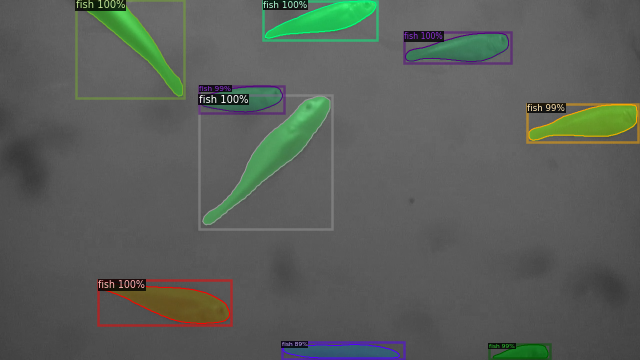

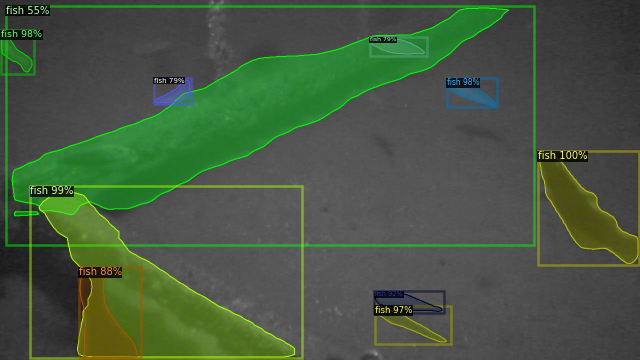

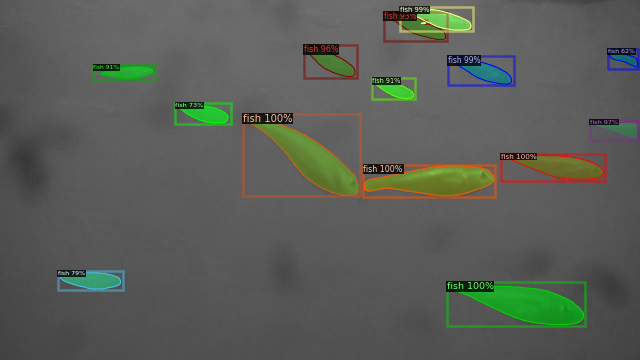

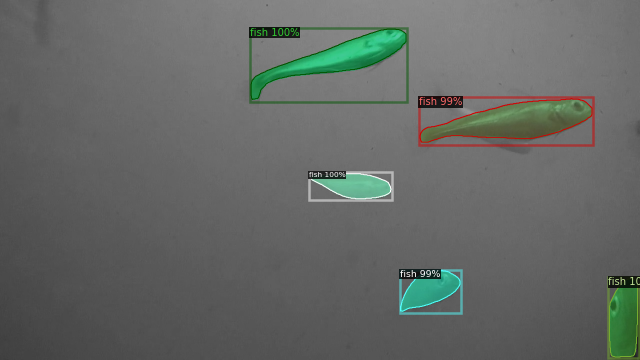

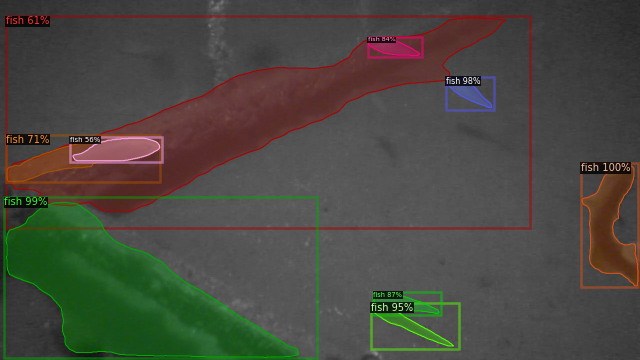

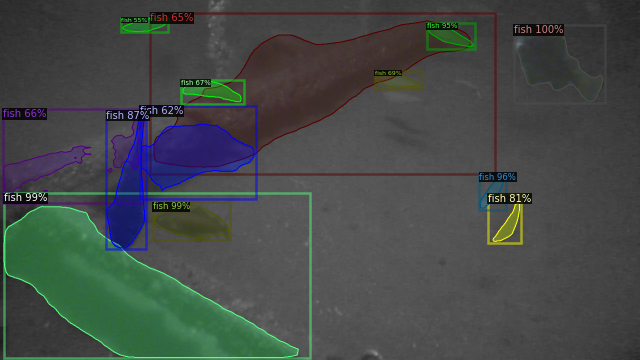

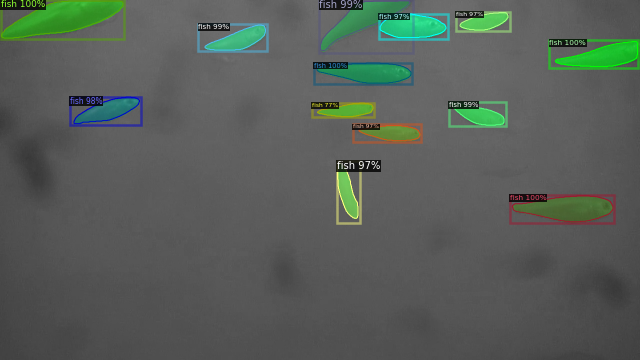

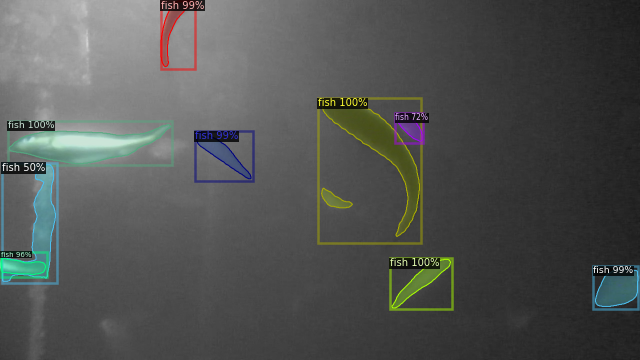

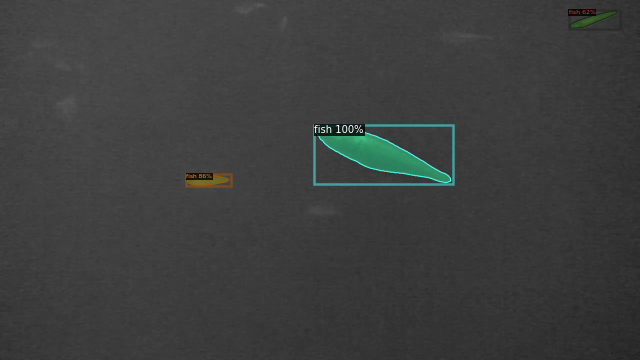

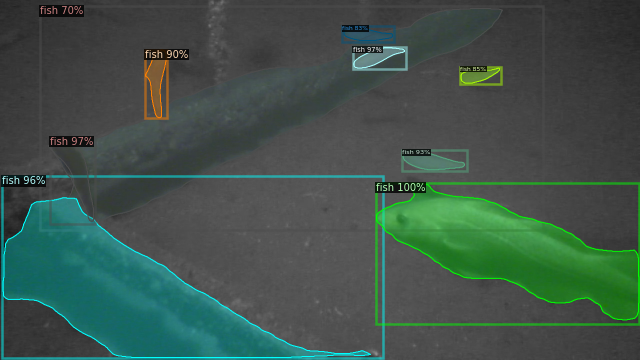

In [ ]:
for d in random.sample(dataset_dicts, 10):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=fish_metadata, 
                   scale=0.5, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("fish_val", cfg, False, output_dir="./output/val/")
val_loader = build_detection_test_loader(cfg, "fish_val")
print(inference_on_dataset(trainer.model, val_loader, evaluator))

流式输出内容被截断，只能显示最后 5000 行内容。
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060
2061
2062
2063
2064
2065
2066
2067
2068
2069
2070
2071
2072
2073
2074
2075
2076
2077
2078
2079
2080
2081
2082
2083
2084
2085
2086
2087
2088
2089
2090
2091
2092
2093
2094
2095
2096
2097
2098
2099
2100
2101
2102
2103
2104
2105
2106
2107
2108
2109
2110
2111
2112
2113
2114
2115
2116
2117
2118
2119
2120
2121
2122
2123
2124
2125
2126
2127
2128
2129
2130
2131
2132
2133
2134
2135
2136
2137
2138
2139
2140
2141
2142
2143
2144
2145
2146
2147
2148
2149
2150
2151
2152
2153
2154
2155
2156
2157
2158
2159
2160
2161
2162
2163
2164
2165
2166
2167
216

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set a custom testing threshold for this model
cfg.DATASETS.TEST = ("fish_test", )
predictor = DefaultPredictor(cfg)

from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_fish_dicts("test")

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

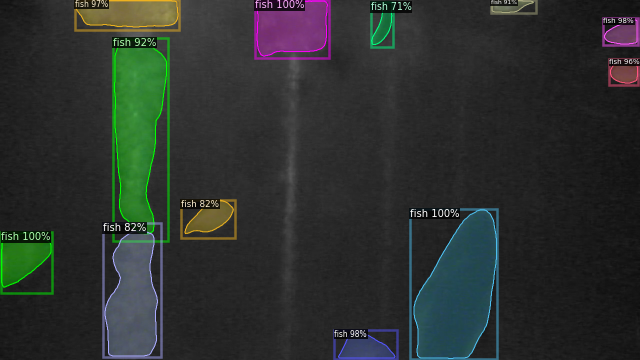

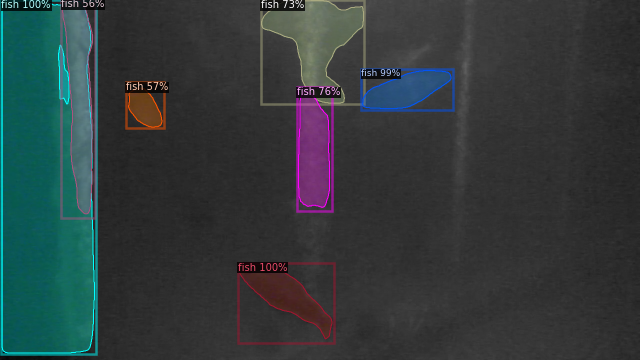

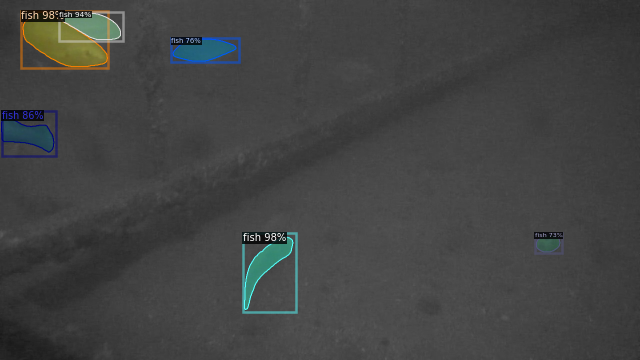

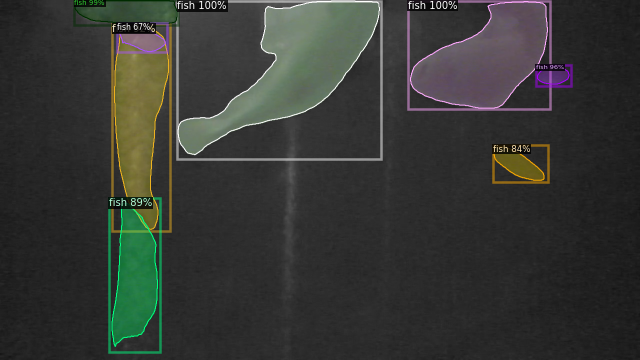

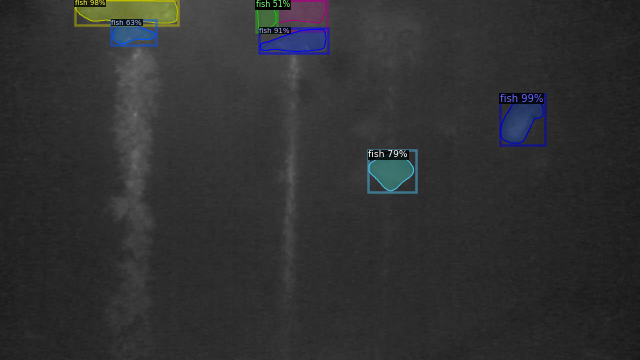

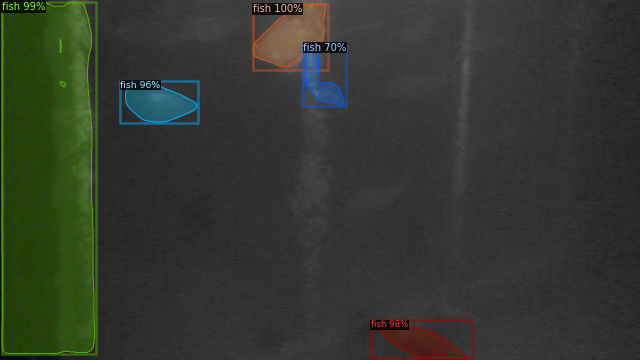

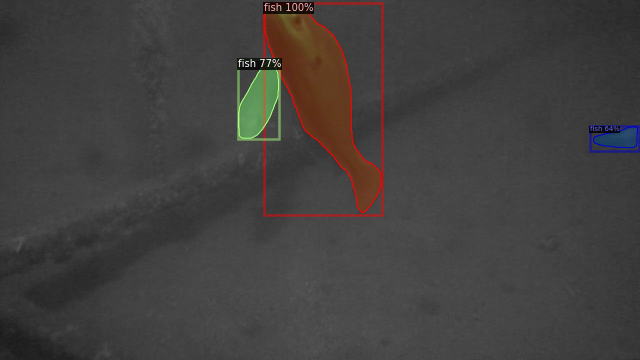

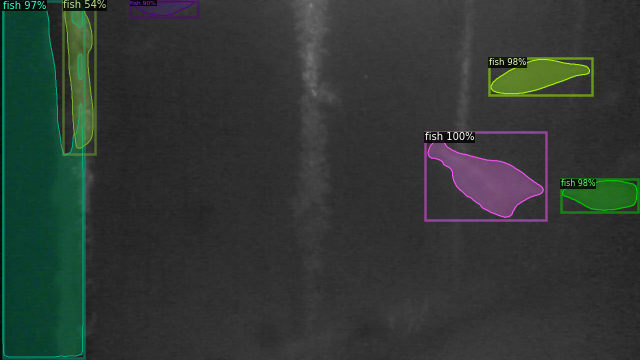

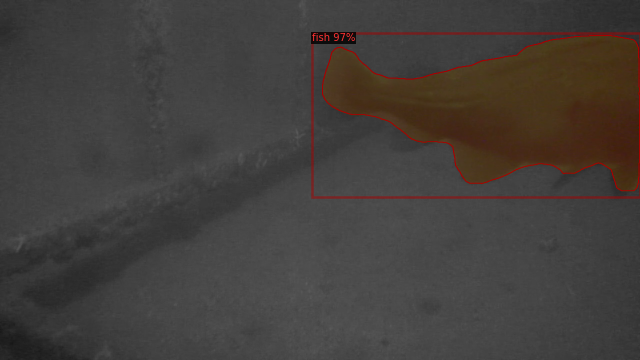

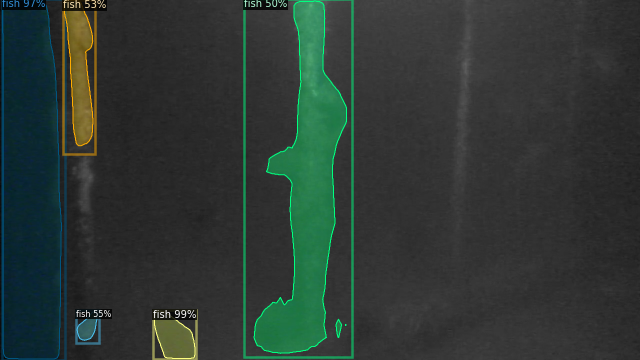

In [ ]:
for d in random.sample(dataset_dicts, 10):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=fish_metadata, 
                   scale=0.5, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("fish_test", cfg, False, output_dir="./output/test/")
val_loader = build_detection_test_loader(cfg, "fish_test")
print(inference_on_dataset(trainer.model, val_loader, evaluator))

[08/07 22:54:02 d2.evaluation.coco_evaluation]: 'fish_test' is not registered by `register_coco_instances`. Therefore trying to convert it to COCO format ...
[08/07 22:54:02 d2.data.datasets.coco]: Converting annotations of dataset 'fish_test' to COCO format ...)
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
21